<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Importing-necessary-libraries-and-data:" data-toc-modified-id="Importing-necessary-libraries-and-data:-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Importing necessary libraries and data:</a></span></li><li><span><a href="#First-glance-of-the-data" data-toc-modified-id="First-glance-of-the-data-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>First glance of the data</a></span></li><li><span><a href="#Basic-data-cleaning-for-SQL-&amp;-Tableau" data-toc-modified-id="Basic-data-cleaning-for-SQL-&amp;-Tableau-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Basic data cleaning for SQL &amp; Tableau</a></span><ul class="toc-item"><li><span><a href="#Rounding-up-bathrooms-and-floors-values-to-convert-them-to-integers-&amp;-formatting-date" data-toc-modified-id="Rounding-up-bathrooms-and-floors-values-to-convert-them-to-integers-&amp;-formatting-date-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Rounding up bathrooms and floors values to convert them to integers &amp; formatting date</a></span></li><li><span><a href="#Changing-some-headers-to-more-meaningful-names-and-transforming-sqft-to-m2" data-toc-modified-id="Changing-some-headers-to-more-meaningful-names-and-transforming-sqft-to-m2-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>Changing some headers to more meaningful names and transforming sqft to m2</a></span></li><li><span><a href="#Exporting-the-data-into-.csv-format" data-toc-modified-id="Exporting-the-data-into-.csv-format-3.3"><span class="toc-item-num">3.3&nbsp;&nbsp;</span>Exporting the data into .csv format</a></span></li></ul></li><li><span><a href="#Exploratory-Data-Analysis" data-toc-modified-id="Exploratory-Data-Analysis-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Exploratory Data Analysis</a></span><ul class="toc-item"><li><span><a href="#Pandas_profiling-report" data-toc-modified-id="Pandas_profiling-report-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>Pandas_profiling report</a></span></li><li><span><a href="#Visual-analysis" data-toc-modified-id="Visual-analysis-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>Visual analysis</a></span></li></ul></li><li><span><a href="#Feature-wrangling" data-toc-modified-id="Feature-wrangling-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Feature wrangling</a></span><ul class="toc-item"><li><span><a href="#Outlier-check" data-toc-modified-id="Outlier-check-5.1"><span class="toc-item-num">5.1&nbsp;&nbsp;</span>Outlier check</a></span></li><li><span><a href="#Data-type-transformations" data-toc-modified-id="Data-type-transformations-5.2"><span class="toc-item-num">5.2&nbsp;&nbsp;</span>Data type transformations</a></span></li><li><span><a href="#Note-on-renovation-of-the-properties" data-toc-modified-id="Note-on-renovation-of-the-properties-5.3"><span class="toc-item-num">5.3&nbsp;&nbsp;</span>Note on renovation of the properties</a></span></li><li><span><a href="#Feature-engineering-/-extraction" data-toc-modified-id="Feature-engineering-/-extraction-5.4"><span class="toc-item-num">5.4&nbsp;&nbsp;</span>Feature engineering / extraction</a></span></li></ul></li><li><span><a href="#Exporting-the-clean-data" data-toc-modified-id="Exporting-the-clean-data-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Exporting the clean data</a></span></li></ul></div>

# Importing necessary libraries and data:

In [1]:
import pandas as pd
import numpy as np
from pandas_profiling import ProfileReport
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [2]:
df = pd.read_csv("Data/real_estate.txt", 
                 names=["id","date","bedrooms","bathrooms","sqft_living","sqft_lot","floors",
                        "waterfront","view","condition","grade","sqft_above","sqft_basement","yr_built", 
                        "yr_renovated","zipcode","lat","long","sqft_living15","sqft_lot15","price"])

# First glance of the data

In [3]:
df.head()

,id,date,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,...,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,price
0,7129300520,10/13/14,3,1.00,1180,5650,1.0,0,0,3,...,1180,0,1955,0,98178,47.5112,-122.257,1340,5650,221900
1,6414100192,12/9/14,3,2.25,2570,7242,2.0,0,0,3,...,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639,538000
2,5631500400,2/25/15,2,1.00,770,10000,1.0,0,0,3,...,770,0,1933,0,98028,47.7379,-122.233,2720,8062,180000
3,2487200875,12/9/14,4,3.00,1960,5000,1.0,0,0,5,...,1050,910,1965,0,98136,47.5208,-122.393,1360,5000,604000
4,1954400510,2/18/15,3,2.00,1680,8080,1.0,0,0,3,...,1680,0,1987,0,98074,47.6168,-122.045,1800,7503,510000


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   bedrooms       21597 non-null  int64  
 3   bathrooms      21597 non-null  float64
 4   sqft_living    21597 non-null  int64  
 5   sqft_lot       21597 non-null  int64  
 6   floors         21597 non-null  float64
 7   waterfront     21597 non-null  int64  
 8   view           21597 non-null  int64  
 9   condition      21597 non-null  int64  
 10  grade          21597 non-null  int64  
 11  sqft_above     21597 non-null  int64  
 12  sqft_basement  21597 non-null  int64  
 13  yr_built       21597 non-null  int64  
 14  yr_renovated   21597 non-null  int64  
 15  zipcode        21597 non-null  int64  
 16  lat            21597 non-null  float64
 17  long           21597 non-null  float64
 18  sqft_l

From first glance, we can see a rather displeasing date format & measuring units (long live the metric system), some seemingly incorrect data types (bathrooms and floors should be integers) and some very similar (and, thus, misleading) headers.

# Basic data cleaning for SQL & Tableau
In this section we'll perform some mild cleaning of the data to be used in the SQL & Tableau deliverable exercises. This preliminarily cleaned dataframe will be exported in .csv format.

## Rounding up bathrooms and floors values to convert them to integers & formatting date

In [5]:
df[['bathrooms', 'floors']] = df[['bathrooms', 'floors']].apply(np.ceil).astype(int)
df['date'] = pd.to_datetime(df['date'], format="%m/%d/%y")
df['date'] = df['date'].dt.strftime('%d/%m/%Y')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   bedrooms       21597 non-null  int64  
 3   bathrooms      21597 non-null  int64  
 4   sqft_living    21597 non-null  int64  
 5   sqft_lot       21597 non-null  int64  
 6   floors         21597 non-null  int64  
 7   waterfront     21597 non-null  int64  
 8   view           21597 non-null  int64  
 9   condition      21597 non-null  int64  
 10  grade          21597 non-null  int64  
 11  sqft_above     21597 non-null  int64  
 12  sqft_basement  21597 non-null  int64  
 13  yr_built       21597 non-null  int64  
 14  yr_renovated   21597 non-null  int64  
 15  zipcode        21597 non-null  int64  
 16  lat            21597 non-null  float64
 17  long           21597 non-null  float64
 18  sqft_l

## Changing some headers to more meaningful names and transforming sqft to m2

In [6]:
col_names = {'date': 'date_sold', 'sqft_living': 'm2_living',
             'sqft_lot': 'm2_total', 'sqft_above': 'm2_above',
            'sqft_basement': 'm2_basement', 'sqft_living15': 'm2_living15', 'sqft_lot15': 'm2_total15'}
df = df.rename(columns=col_names)
df[['m2_living', 'm2_total', 'm2_above', 'm2_basement', 'm2_living15', 'm2_total15']] = round(df[['m2_living', 'm2_total', 'm2_above', 'm2_basement', 'm2_living15', 'm2_total15']] / 10.764, 2)
df.head()

,id,date_sold,bedrooms,bathrooms,m2_living,m2_total,floors,waterfront,view,condition,...,m2_above,m2_basement,yr_built,yr_renovated,zipcode,lat,long,m2_living15,m2_total15,price
0,7129300520,13/10/2014,3,1,109.62,524.90,1,0,0,3,...,109.62,0.00,1955,0,98178,47.5112,-122.257,124.49,524.90,221900
1,6414100192,09/12/2014,3,3,238.76,672.80,2,0,0,3,...,201.60,37.16,1951,1991,98125,47.7210,-122.319,157.00,709.68,538000
2,5631500400,25/02/2015,2,1,71.53,929.02,1,0,0,3,...,71.53,0.00,1933,0,98028,47.7379,-122.233,252.69,748.98,180000
3,2487200875,09/12/2014,4,3,182.09,464.51,1,0,0,5,...,97.55,84.54,1965,0,98136,47.5208,-122.393,126.35,464.51,604000
4,1954400510,18/02/2015,3,2,156.08,750.65,1,0,0,3,...,156.08,0.00,1987,0,98074,47.6168,-122.045,167.22,697.05,510000


## Exporting the data into .csv format

In [7]:
df.to_csv(r'Data/deliverables_data.csv', index = None, header=True)

# Exploratory Data Analysis
In this section, we will dwell into the data at hand to fully understand it and evaluate further cleaning, wrangling and feature extraction steps.

Before anything else we will drop the column 'id', since it will only add noise to the data and it doesn't have any real meaning or use.

In [8]:
df.drop('id', axis=1, inplace=True)

## Pandas_profiling report
As an overview of the data, we will use the library pandas_profiling to create a report for us.

In [9]:
df.profile_report(title="EDA")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

From the report, which is very detailed, we can extract the following insights/action points:
- There are no NULL values or duplicates in the dataframe.
- Most of the variables (15 vs. 5) are numerical, but some of them might be categoricals in disguise.
- **bedrooms**: Huge outlier at 33 bedrooms. We'll check the affected row, and if it appears to be a typo (by price, living_m2, etc.) we'll either just drop it or change the bedrooms value to one that fits the other features. Other than that, the distribution seems normal. Categorical in nature, it will need a dtype change.
- **bathrooms**: Clear mode of 3 bathrooms. The distribution is skewed to the right, but no actions seem to be needed other than changing its dtype to categorical.
- **m2_living**: Mean is almost 200m2, so we're probably dealing with detached houses mostly. There are few extreme values (>350m2 aprox), but they don't seem to be wrong, just huge properties. Checks for consistency with other variables will be performed. Apart from these extrem values, distribution is normal.
- **m2_total**: Extreme outliers at > 50.000m2 of plot area that completely skew the distribution. Dealing of those cases will be decided upon closer inspection.
- **floors**: Categorical in form and nature, the mode is 1 closely followed by 2 floors. The maximum value is 4, which is plausible. No transformations will be needed.
- **waterfront**: Highly imbalanced categorical feature. Only 163 of the 21597 properties are at the waterfront. It needs to be changed to either boolean or int to act as a true boolean.
- **view**: Categorical variable rating the view of the houses in a 0-4 grading system. It is extremely imbalanced, so it's a good candidate to be dropped.
- **condition**: Categorical in nature and form, no actions seem to be needed. Mode is 3, right in the middle.
- **grade**: Categorical in nature but numerical in form (we'll address that), seems to be similar to condition, so multicollinearity between both features will need to be checked. Also, a simpler category system will be proposed.
- **m2_above**: Area of the property excluding the basement. Distribution is slightly skewed to the right, but quite normal, and there are some outliers. We'll check if they match the m2_living ones.
- **m2_basement**: Most values are 0, which means that most properties don't have a basement. Maybe we'll extract a boolean feature from this one (basement yes/no) or a categorical one (no basement, small, medium, large). Apart from the zeroes, the distribution seems normal but platykurtic.
- **yr_built**: No clear distribution can be observed, although more properties are built in the last 50 years. Candidate to be transformed to a categorical variable.
- **yr_renovated**: Most values are 0, which indicates that most of them are not renovated. A boolean needs to be extracted (renovated yes/no), and it's a good candidate to be dropped due to its extreme imbalance.
- **zipcode**: Categorical in nature, but numerical in form. It will need to be transformed and, later on, encoded. No clear distribution appreciated.
- **lat & long**: They're treated as numerical features, but it's geo data, so they are probably inducing noise to the dataset. Having the zipcode, it'll probably be better to drop them altogether.
- **m2_living15**: The actual living surface of properties at the time they're sold. No major outliers, it has a slightly skewed to the right normal distribution. It's probably better to keep this instead of m2_living considering it's an updated version of the former and it has less extreme values.
- **m2_total15**: Same as m2_living15 for the lot area. There are extreme outliers that completely alter the distribution, just as in m2_total. Those will be checked and dealt with. Again, probably better to keep this variable instead of m2_total.
- **price**: Higly skewed to the right due to outliers > 1.5M aprox. Most extreme values will be checked to see consistency with other variables. Other than that, distribution seems normal.

## Visual analysis

In [10]:
correlations_matrix = df.corr()

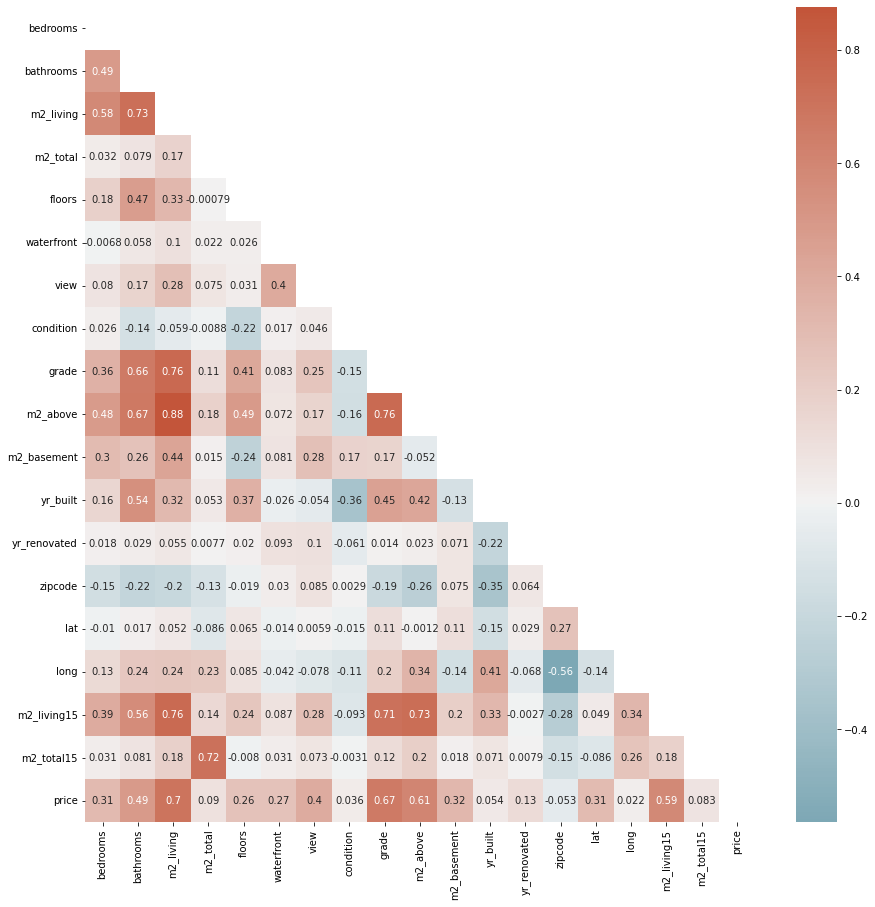

In [11]:
mask=np.zeros_like(correlations_matrix)
mask[np.triu_indices_from(mask)]=True
fig, ax = plt.subplots(figsize=(15,15))
ax=sns.heatmap(correlations_matrix, mask=mask, annot=True, center=0, 
               cmap=sns.diverging_palette(220, 20, as_cmap=True));

<AxesSubplot:xlabel='price', ylabel='m2_living'>

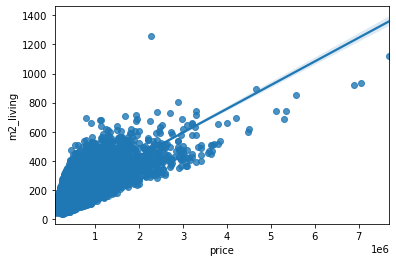

In [43]:
sns.regplot(data=df, x='price', y='m2_living')

<AxesSubplot:xlabel='price', ylabel='m2_living15'>

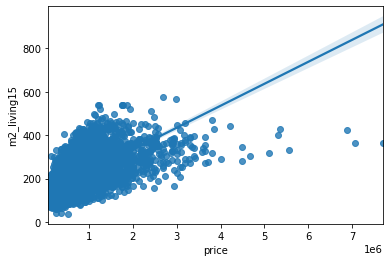

In [45]:
sns.regplot(data=df, x='price', y='m2_living15')

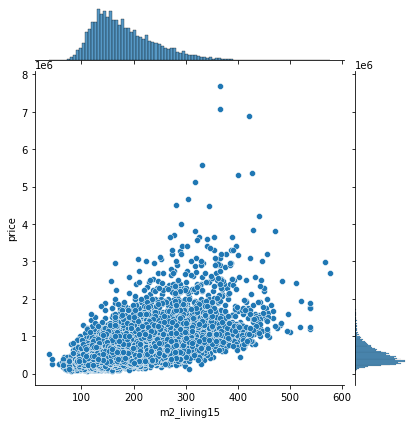

In [42]:
sns.jointplot(data=df, y='price',x='m2_living15');

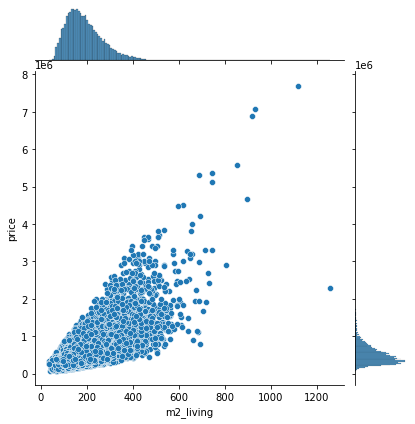

In [44]:
sns.jointplot(data=df, y='price',x='m2_living');

<AxesSubplot:xlabel='bedrooms', ylabel='price'>

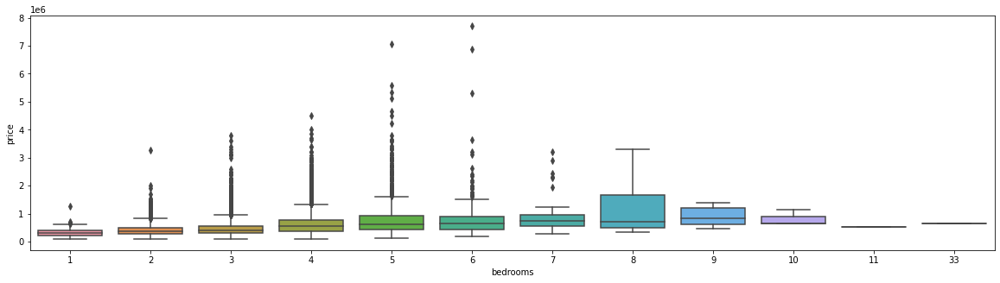

In [22]:
plt.figure(figsize=(20,5))
sns.boxplot(x='bedrooms',y='price',data=df)

<AxesSubplot:xlabel='bathrooms', ylabel='price'>

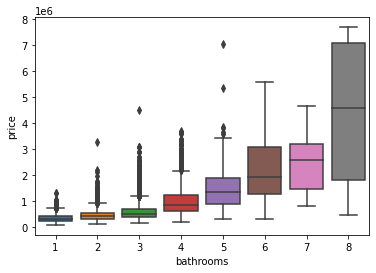

In [26]:
sns.boxplot(x='bathrooms',y='price',data=df)

Text(0.5, 1.0, 'price vs view')

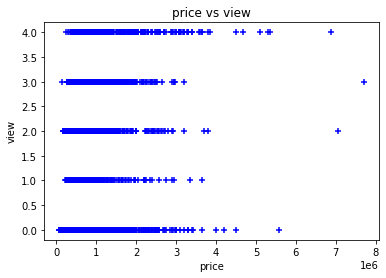

In [33]:
plt.scatter(data=df, x='price',y='view', color='blue',marker='+',alpha=1)
plt.xlabel('price')
plt.ylabel('view')
plt.title('price vs view')

<AxesSubplot:xlabel='grade', ylabel='price'>

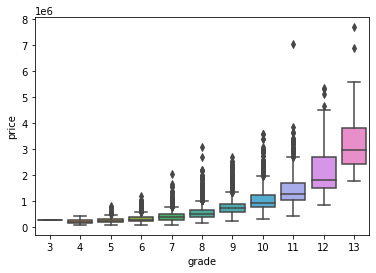

In [40]:
sns.boxplot(x='grade',y='price',data=df)

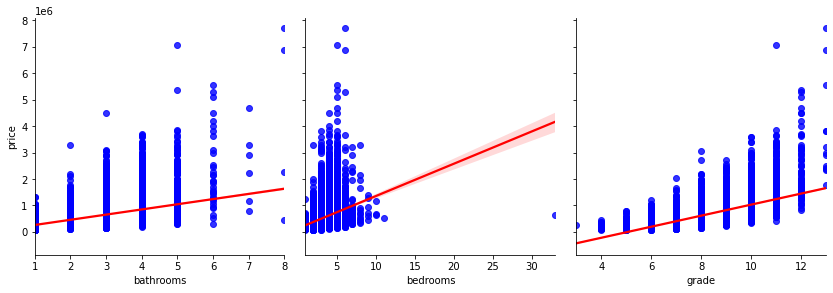

In [46]:
g = sns.PairGrid(df, y_vars=["price"], x_vars=["bathrooms", "bedrooms", "grade"], height=4)
g.map(sns.regplot, color="b", line_kws={'color': 'red'})

# Feature wrangling
In the following section we will apply the transformations mentioned above. For now, we will keep all columns and drop them upon trial & error in the modeling phase.

## Outlier check

From the report, it seemed that the only outlier in the bedrooms feature was the 33, but on closer inspection we noticed that almost all properties with 8 or more bedrooms are too small for that value to be true. We looked into US real estate reports to verify if, for example, a 271m2 house can have 10 bedrooms or a 259m2 one can have 8 bedrooms, and it seems highly implausible. Furthermore, properties with more than 500m2 in our dataset have, at most, 5-6 bedrooms. Thus, we substituted those bedroom values (8 or more) with the average number of bedrooms by home size in the US we found on the internet.

In [12]:
df.loc[df['bedrooms'] > 7]

,date_sold,bedrooms,bathrooms,m2_living,m2_total,floors,waterfront,view,condition,grade,m2_above,m2_basement,yr_built,yr_renovated,zipcode,lat,long,m2_living15,m2_total15,price
1658,04/12/2014,8,5,260.13,239.69,2,0,0,3,8,174.66,85.47,1997,0,98122,47.6086,-122.303,167.22,239.69,490000
4031,07/10/2014,8,6,403.20,874.67,2,0,0,3,8,403.20,0.00,1967,0,98004,47.6316,-122.202,190.45,845.41,2150000
4063,19/02/2015,8,3,264.77,1181.16,1,0,0,3,7,264.77,0.00,1959,0,98055,47.4859,-122.205,137.50,459.12,373000
4092,07/05/2014,9,5,355.82,649.20,3,0,0,3,7,227.61,128.21,1938,0,98103,47.6927,-122.338,135.64,584.45,599999
4231,06/01/2015,9,3,341.88,408.77,2,0,0,3,7,262.91,78.97,1908,0,98102,47.6374,-122.324,182.09,227.61,700000
6073,08/08/2014,9,5,339.09,464.51,2,0,0,3,8,235.04,104.05,1915,2010,98105,47.6604,-122.289,233.18,464.51,1280000
6168,03/07/2014,8,3,259.20,621.98,1,0,0,3,7,136.57,122.63,1977,0,98133,47.7565,-122.331,163.51,708.29,340000
8537,11/08/2014,9,8,376.25,604.24,2,0,0,3,7,376.25,0.00,1996,0,98144,47.5923,-122.301,134.52,359.16,450000
8748,21/08/2014,11,3,278.71,460.80,2,0,0,3,7,222.97,55.74,1918,1999,98106,47.5560,-122.363,131.92,460.80,520000
9068,18/03/2015,8,3,211.82,278.71,2,0,0,3,7,112.41,99.41,1911,0,98105,47.6675,-122.316,149.57,278.71,700000


In [13]:
def bedroom_resize(bed, liv15):
    if bed > 7:
        if liv15 > 300:
            return 5
        elif liv15 > 200:
            return 4
        else:
            return 3
    else:
        return bed

df['bedrooms'] = df.apply(lambda x: bedroom_resize(bed = x['bedrooms'],
                                                   liv15 = x['m2_living15']), axis=1)

Now, let's check outliers for m2_living & m2_living15. They are huge houses with very high prices, so we assume they're all correct and, in fact, very necessary to predict this high-end part of the real estate properties' distribution.

In [14]:
df.loc[df['m2_living'] > 800]

,date_sold,bedrooms,bathrooms,m2_living,m2_total,floors,waterfront,view,condition,grade,m2_above,m2_basement,yr_built,yr_renovated,zipcode,lat,long,m2_living15,m2_total15,price
3910,11/06/2014,5,5,932.74,3467.58,2,1,2,3,11,713.49,219.25,1940,2001,98004,47.6500,-122.214,365.11,2364.27,7060000
4407,04/08/2014,5,6,854.70,3257.99,2,0,0,3,13,575.99,278.71,2001,0,98039,47.6289,-122.233,330.73,2261.71,5570000
7245,13/10/2014,6,8,1119.47,2564.10,3,0,3,4,13,796.17,323.30,1910,1987,98102,47.6298,-122.323,366.03,817.54,7700000
8085,17/06/2014,5,7,895.58,1214.05,1,1,4,3,12,447.79,447.79,1983,2009,98040,47.5570,-122.210,303.79,971.20,4670000
9245,19/09/2014,6,8,918.80,2914.72,2,0,4,3,13,823.11,95.69,2001,0,98039,47.6305,-122.240,421.78,3969.71,6890000
12764,05/05/2014,7,8,1257.90,28590.86,3,0,4,3,12,874.21,383.69,1999,0,98053,47.6675,-121.986,450.58,20234.11,2280000
14542,11/06/2014,5,7,805.46,5948.81,2,0,4,3,13,568.56,236.90,1965,2003,98177,47.7295,-122.372,384.62,7527.03,2890000


In [15]:
df.loc[df['m2_living15'] > 500]

,date_sold,bedrooms,bathrooms,m2_living,m2_total,floors,waterfront,view,condition,grade,m2_above,m2_basement,yr_built,yr_renovated,zipcode,lat,long,m2_living15,m2_total15,price
1122,25/06/2014,4,2,370.68,1251.39,2,0,0,3,11,370.68,0.00,2006,0,98059,47.5305,-122.131,537.90,1273.60,1200000
1528,27/08/2014,4,4,355.82,3833.43,2,0,0,4,11,355.82,0.00,1990,0,98077,47.7237,-122.042,520.25,5255.30,1250000
5446,10/10/2014,4,4,454.29,1245.08,2,0,0,3,13,454.29,0.00,2004,0,98059,47.5303,-122.131,537.90,1257.80,1780000
10362,12/12/2014,5,6,687.48,1755.67,2,0,3,3,13,584.36,103.12,2001,0,98006,47.5431,-122.112,567.63,2456.52,2980000
11859,12/01/2015,4,4,689.33,15595.41,2,0,3,3,12,689.33,0.00,2002,0,98045,47.4548,-121.764,521.18,15751.49,1950000
12700,28/04/2015,5,3,427.35,2159.98,2,0,2,3,9,334.45,92.90,1918,2003,98004,47.6230,-122.218,510.96,1864.18,2410000
16416,02/02/2015,6,5,544.41,1293.94,2,0,3,3,10,385.54,158.86,2013,0,98006,47.5382,-122.114,537.90,1293.94,1750000
19842,22/01/2015,4,4,729.28,8328.78,2,0,0,3,12,729.28,0.00,2006,0,98027,47.5406,-121.982,576.92,8903.01,2700000
20547,04/08/2014,5,4,537.90,1275.18,2,0,3,3,10,411.56,126.35,2014,0,98006,47.5388,-122.114,537.90,1275.18,1240000
20814,02/10/2014,5,4,537.90,1183.48,2,0,3,3,10,411.56,126.35,2014,0,98006,47.5380,-122.114,537.90,1293.94,1750000


It's turn for m2_total and m2_total15. In this case, we're probably dealing with rural properties with a lot of land in the lot. We consider it's a very specific type of property that needs to be accounted for and, therefore, we will keep all these observations.

In [16]:
df.loc[df['m2_total'] > 50000]

,date_sold,bedrooms,bathrooms,m2_living,m2_total,floors,waterfront,view,condition,grade,m2_above,m2_basement,yr_built,yr_renovated,zipcode,lat,long,m2_living15,m2_total15,price
1717,27/03/2015,4,1,120.77,153414.99,1,0,3,4,6,120.77,0.00,1920,0,98022,47.2313,-122.023,237.83,39537.44,700000
3945,05/09/2014,4,4,350.24,91322.74,2,0,0,3,10,350.24,0.00,1992,0,98058,47.4140,-122.087,212.75,3450.48,998000
4437,30/07/2014,2,3,237.83,91255.85,1,0,0,3,8,237.83,0.00,2004,0,98014,47.6955,-121.861,150.50,3803.98,790000
4536,29/09/2014,3,2,339.09,78345.32,2,0,0,4,7,339.09,0.00,1991,0,98070,47.3627,-122.496,173.73,25454.48,550000
6685,20/03/2015,2,3,362.32,85509.38,2,0,0,3,12,362.32,0.00,2009,0,98065,47.5371,-121.756,252.69,38272.20,2000000
7070,05/01/2015,4,4,364.18,81907.66,3,0,3,3,11,364.18,0.00,2002,0,98024,47.5385,-121.896,275.92,10440.73,1650000
7287,20/11/2014,2,2,155.98,53660.81,2,0,0,3,9,155.98,0.00,2001,0,98070,47.4630,-122.475,171.87,33345.78,700000
7640,21/05/2014,5,4,279.64,99797.29,2,0,0,5,8,186.73,92.90,1931,0,98027,47.4564,-122.004,227.61,6394.00,542500
7762,19/01/2015,4,4,374.40,95138.24,2,0,0,3,10,374.40,0.00,2006,0,98045,47.4619,-121.744,170.01,1086.96,855000
9705,07/01/2015,4,4,515.14,80936.45,2,0,0,3,11,334.91,180.23,2003,0,98014,47.6760,-121.882,317.73,80936.45,937500


In [17]:
df.loc[df['m2_total15'] > 50000]

,date_sold,bedrooms,bathrooms,m2_living,m2_total,floors,waterfront,view,condition,grade,m2_above,m2_basement,yr_built,yr_renovated,zipcode,lat,long,m2_living15,m2_total15,price
9705,07/01/2015,4,4,515.14,80936.45,2,0,0,3,11,334.91,180.23,2003,0,98014,47.6760,-121.882,317.73,80936.45,937500
13451,07/11/2014,3,3,245.26,40137.12,2,0,3,3,10,245.26,0.00,1996,0,98022,47.1795,-122.036,139.35,52082.59,790000
20436,15/04/2015,4,6,606.65,80936.45,2,0,2,3,11,606.65,0.00,2008,0,98014,47.6640,-121.878,118.91,79722.41,1600000


## Data type transformations

Changing dtypes to str for categorical features

In [18]:
df[['bedrooms', 'bathrooms', 'floors',
    'condition', 'grade', 'zipcode', 'view']] = df[['bedrooms','bathrooms', 'floors', 'condition',
                                                    'grade', 'zipcode', 'view']].astype(str)

Changing the feature waterfront to boolean

In [19]:
df['waterfront'] = df['waterfront'].astype(bool)

## Note on renovation of the properties
Upon closer inspection, we found out that properties with a value of 0 in yr_renovated (in theory never renovated) have different m2_living and m2_living15 values, which indicates that indeed they have been renovated. Thus, the boolean renovation feature must take this into account.

In [20]:
df.loc[df['yr_renovated'] == 0]

,date_sold,bedrooms,bathrooms,m2_living,m2_total,floors,waterfront,view,condition,grade,m2_above,m2_basement,yr_built,yr_renovated,zipcode,lat,long,m2_living15,m2_total15,price
0,13/10/2014,3,1,109.62,524.90,1,False,0,3,7,109.62,0.00,1955,0,98178,47.5112,-122.257,124.49,524.90,221900
2,25/02/2015,2,1,71.53,929.02,1,False,0,3,6,71.53,0.00,1933,0,98028,47.7379,-122.233,252.69,748.98,180000
3,09/12/2014,4,3,182.09,464.51,1,False,0,5,7,97.55,84.54,1965,0,98136,47.5208,-122.393,126.35,464.51,604000
4,18/02/2015,3,2,156.08,750.65,1,False,0,3,8,156.08,0.00,1987,0,98074,47.6168,-122.045,167.22,697.05,510000
5,12/05/2014,4,5,503.53,9469.53,1,False,0,3,11,361.39,142.14,2001,0,98053,47.6561,-122.005,442.21,9469.53,1230000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21592,21/05/2014,3,3,142.14,105.07,3,False,0,3,8,142.14,0.00,2009,0,98103,47.6993,-122.346,142.14,140.19,360000
21593,23/02/2015,4,3,214.60,540.04,2,False,0,3,8,214.60,0.00,2014,0,98146,47.5107,-122.362,170.01,668.90,400000
21594,23/06/2014,2,1,94.76,125.42,2,False,0,3,7,94.76,0.00,2009,0,98144,47.5944,-122.299,94.76,186.45,402101
21595,16/01/2015,3,3,148.64,221.85,2,False,0,3,8,148.64,0.00,2004,0,98027,47.5345,-122.069,130.99,119.57,400000


## Feature engineering / extraction

Creating a categorical feature from yr_built based on percentiles. It will have 5 values, each containing values from 20 percentiles.

In [21]:
df['yr_built_bins'] = pd.qcut(df['yr_built'], 5, 
                              labels=["1900-1947", "1947-1965", "1965-1983",
                                      "1983-2001", "2001-2015"])

In [22]:
df['yr_built_bins'] = df['yr_built_bins'].astype(object)

Simplifying the grade variable into 5 labels to better check multicollinearity with the variable condition in a new column named 'grade_cat'.

In [23]:
def grade_cat(x):
    if x in ['1', '2', '3', '4', '5']:
        x = '1'
    elif x == '6':
        x = '2'
    elif x in ['7', '8']:
        x = '3'
    elif x in ['9', '10']:
        x = '4'
    else:
        x = '5'
    return x

df['grade_cat']=list(map(grade_cat, df['grade']))

In [24]:
df['grade_cat'].unique()

array(['3', '2', '5', '4', '1'], dtype=object)

New boolean column with the logic renovated yes/no based on value of yr_renovated (different than 0) and the difference in values between m2_living & m2_living15 and m2_total & m2_total15. The reasoning behind is that, if either m2_living15 or m2_total15 have changed with respect to m2_living or m2_total, respectively, some renovations have occurred.

In [25]:
def renovation_bool(yr, liv, liv15, total, total15):
    if yr != 0 or (liv-liv15) != 0 or (total-total15) != 0:
        return True
    else:
        return False

df['renovated'] = df.apply(lambda x: renovation_bool(yr = x['yr_renovated'], 
                                                     liv = x['m2_living'], 
                                                     liv15 = x['m2_living15'], 
                                                     total= x['m2_total'],
                                                     total15 = x['m2_total15']), axis=1)

Since m2_basement consists of mostly 0 as a value, meaning most properties don't have a basement, we consider more fit to create a new categorical feature with values 'no_basement', 'small', 'medium' and 'large'. The 3 sizes are determined by their respective quantiles excluding 0.

In [26]:
df['m2_basement'].replace(0, np.nan, inplace=True)

When passing nan values in the qcut function, it ignores them and considers the distribution with real values


In [27]:
df['basement_cat'] = pd.qcut(df['m2_basement'], 3, 
                              labels=["small", "medium", "large",])

In [28]:
df['basement_cat'] = df['basement_cat'].astype(object)
df['basement_cat'].fillna('no_basement', inplace=True)

In [37]:
df['m2_basement'].replace(np.nan, 0, inplace=True)

We will also extract the month and year as separate columns from our date_sold feature.

In [34]:
import datetime as dt
df['date_sold'] = pd.to_datetime(df['date_sold'], format="%d/%m/%Y")
df['day'] = df['date_sold'].dt.day
df['weekday'] = df['date_sold'].dt.dayofweek
df['month'] = df['date_sold'].dt.month
df['year'] = df['date_sold'].dt.year

This is how our dataframe looks after all the feature engineering and extraction we performed. Probably further extractions will be made in the modeling phase.

In [38]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 28 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   date_sold      21597 non-null  datetime64[ns]
 1   bedrooms       21597 non-null  object        
 2   bathrooms      21597 non-null  object        
 3   m2_living      21597 non-null  float64       
 4   m2_total       21597 non-null  float64       
 5   floors         21597 non-null  object        
 6   waterfront     21597 non-null  bool          
 7   view           21597 non-null  object        
 8   condition      21597 non-null  object        
 9   grade          21597 non-null  object        
 10  m2_above       21597 non-null  float64       
 11  m2_basement    21597 non-null  float64       
 12  yr_built       21597 non-null  int64         
 13  yr_renovated   21597 non-null  int64         
 14  zipcode        21597 non-null  object        
 15  lat            2159

# Exporting the clean data

In [39]:
df.to_csv(r'Data/clean_data.csv', index = None, header=True)